# Opening a restaurant in the city of Taganrog

## Data collection
This section covers data acquisition steps.

Let's import all necessary packages

In [49]:
import numpy as np 
import pandas as pd
import json 

from geopy.geocoders import Nominatim

import requests 
from pandas.io.json import json_normalize

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium 
import time

import matplotlib.pyplot as plt

#### Get the city bounding box using Nominatim search engine for OpenStreetMap data 

In [2]:
url_bounds = 'https://nominatim.openstreetmap.org/search?format=json&q=Taganrog, Russia&polygon_geojson=1'
# get borders in json format
result = requests.get(url_bounds).json()[0]
bounds = result['boundingbox']

# convert to float
city_rect = [float(i) for i in bounds] 
city_center = [float(result['lat']), float(result['lon'])]

# city south-west corner
city_sw = [city_rect[0], city_rect[2]]
# city north-east corner
city_ne=[city_rect[1], city_rect[3]]

print('city rect:', city_rect)
print('city center:', city_center)

city rect: [47.1887122, 47.2899427, 38.7929772, 38.9701473]
city center: [47.2153657, 38.9285216]


In [50]:
grid_step = 0.005
map_tag = folium.Map(location=city_center, zoom_start=12)
for lat in np.arange(city_rect[0], city_rect[1], grid_step):
    for lon in np.arange(city_rect[2], city_rect[3], grid_step):
        folium.Rectangle([[lat, lon], [lat+grid_step, lon+grid_step]], color='red', weight=0.3).add_to(map_tag)

map_tag.fit_bounds([city_sw, city_ne])        
map_tag

##### Define Foursquare Credentials and Version

In [1]:
# Pull API keys from the file
with open('4square_keys.txt','r') as f:
    CLIENT_ID, CLIENT_SECRET = [l.strip() for l in f.readlines()]

VERSION = '20180604'
LIMIT = 500

Define a function to search venues located within a specified rectangle.

In [4]:
def searchVenuesInRect(sw, ne):
    
    venues_list=[]
    
    def get_category(cat_list):
        if len(cat_list) == 0: return None
        else: return cat_list[0]['name']
              
    # create the API request URL
    url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&intent=browse&sw={},{}&ne={},{}&limit={}'.format(
            CLIENT_ID, CLIENT_SECRET, VERSION, 
            sw[0], sw[1], ne[0], ne[1],
            LIMIT)
            
    # make the GET request
    results = requests.get(url).json()['response']['venues']
        
    # return only relevant information for each nearby venue
    venues_list.append([(
        v['name'], 
        v['location']['lat'], 
        v['location']['lng'],  
        get_category(v['categories']),
        v['id']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = [
        'Venue', 'Latitude', 'Longitude', 'Category', 'Id']
    
    return(nearby_venues)
        

In [33]:
text='food'
apikey='07f60e37-ca89-4234-8d4f-f05b17b05dd2'
url = 'https://search-maps.yandex.ru/v1/?text={}&type=biz&lang=ru_RU&bbox={},{}~{},{}&apikey={}&results=5&rspn=1'.format(
            text, 
            city_center[1], 
            city_center[0], 
            city_center[1]+0.005, 
            city_center[0]+0.005,
            apikey)
url

'https://search-maps.yandex.ru/v1/?text=food&type=biz&lang=ru_RU&bbox=38.9285216,47.2153657~38.933521600000006,47.2203657&apikey=07f60e37-ca89-4234-8d4f-f05b17b05dd2&results=5&rspn=1'

In [47]:
#results = requests.get(url).json()
#results['features'][0]['properties']['name']
print(len(results['features']))
results['features'][0]['properties']

3


{'name': 'Осака',
 'description': 'Петровская ул., 84, Таганрог, Россия',
 'boundedBy': [[38.9256115, 47.21264093], [38.9338225, 47.21823493]],
 'CompanyMetaData': {'id': '1057228188',
  'name': 'Осака',
  'address': 'Россия, Ростовская область, Таганрог, Петровская улица, 84',
  'url': 'https://www.pravberdon.ru/',
  'Phones': [{'type': 'phone', 'formatted': '+7 (8634) 34-36-90'}],
  'Categories': [{'class': 'sushi', 'name': 'Суши-бар'},
   {'name': 'Доставка еды и обедов'}],
  'Hours': {'text': 'пн-чт 11:00–0:00; пт,сб 11:00–2:00; вс 11:00–0:00',
   'Availabilities': [{'Intervals': [{'from': '11:00:00', 'to': '00:00:00'}],
     'Monday': True,
     'Tuesday': True,
     'Wednesday': True,
     'Thursday': True},
    {'Intervals': [{'from': '11:00:00', 'to': '02:00:00'}],
     'Friday': True,
     'Saturday': True},
    {'Intervals': [{'from': '11:00:00', 'to': '00:00:00'}], 'Sunday': True}]}}}

#### Get the list of all venues in the city iterating over cell of coordinate grid

In [ ]:
grid_step = 0.005
city_venues = pd.DataFrame(columns=['Venue', 'Latitude', 'Longitude', 'Category', 'Id'])
for lat in np.arange(city_rect[0], city_rect[1], grid_step):
    for lon in np.arange(city_rect[2], city_rect[3], grid_step):
        loc_venues = searchVenuesInRect(sw=[lat, lon], ne=[lat+grid_step, lon+grid_step])
        city_venues = city_venues.append(loc_venues)

print(city_venues.shape)
city_venues.head()

Drop all venues that have an empty **Category** field.

In [472]:
city_venues = city_venues.dropna(subset=['Category'])

Remove all duplicated venues.

In [ ]:
city_venues = city_venues.drop_duplicates('Id')
city_venues = city_venues.reset_index(drop=True)

##### Save the dataset to csv.

In [40]:
# save dataframe to csv file
city_venues.to_csv('city_venues.csv', index=False)

### Get categories
Now pull all possible categories from Foursquare using its API endpoint **categories** and define a function to determine venues for food among all city venues.

In [36]:
url_cat = 'https://api.foursquare.com/v2/venues/categories?client_id={}&client_secret={}&v={}'.format(CLIENT_ID, CLIENT_SECRET, VERSION)
url_cat

'https://api.foursquare.com/v2/venues/categories?client_id=V53MHPBBL23EVUFTF31HTKJAFRJIK2QL1WJURTZ3ARRFF3KE&client_secret=G5Z0ALDAAKEOPESPXKBZPXNB2TIEJKGWM33ZGSBCNW0VGW0T&v=20180604'

In [37]:
result = requests.get(url_cat).json()
df_cat = json_normalize(result['response']['categories'])
df_cat.head()

,id,name,pluralName,shortName,categories,icon.prefix,icon.suffix
0,4d4b7104d754a06370d81259,Arts & Entertainment,Arts & Entertainment,Arts & Entertainment,"[{'id': '56aa371be4b08b9a8d5734db', 'name': 'A...",https://ss3.4sqi.net/img/categories_v2/arts_en...,.png
1,4d4b7105d754a06372d81259,College & University,Colleges & Universities,College & Education,"[{'id': '4bf58dd8d48988d198941735', 'name': 'C...",https://ss3.4sqi.net/img/categories_v2/educati...,.png
2,4d4b7105d754a06373d81259,Event,Events,Event,"[{'id': '52f2ab2ebcbc57f1066b8b3b', 'name': 'C...",https://ss3.4sqi.net/img/categories_v2/event/d...,.png
3,4d4b7105d754a06374d81259,Food,Food,Food,"[{'id': '503288ae91d4c4b30a586d67', 'name': 'A...",https://ss3.4sqi.net/img/categories_v2/food/de...,.png
4,4d4b7105d754a06376d81259,Nightlife Spot,Nightlife Spots,Nightlife,"[{'id': '4bf58dd8d48988d116941735', 'name': 'B...",https://ss3.4sqi.net/img/categories_v2/nightli...,.png


In [38]:
def findCategory(cat_list, cat_id):
    if len(cat_list) == 0: return False
    df = json_normalize(cat_list)
    if df[df.id == cat_id].shape[0] > 0: return True
    for c in df.categories: 
        if findCategory(c, cat_id): return True
    return False

def isFoodCategory(df, cat_id):
    food_id = '4d4b7105d754a06374d81259'
    if cat_id == food_id: return True
    if findCategory(df.loc[df.id == food_id, 'categories'].to_list()[0], cat_id): return True
    return False

Add new field **Food_venue** to identify the venue for food and convert booleans to integers i.e 0 and 1 values.

In [ ]:
mask = city_venues['Category_id'].map(lambda x: isFoodCategory(df_cat, x))
food_venues = city_venues.loc[mask]
city_venues['Food_venue'] = mask * 1

In [434]:
display_cols = ['Venue', 'Latitude', 'Longitude', 'Category', 'Food_venue']
city_venues[display_cols].head()

,Venue,Latitude,Longitude,Category,Food_venue
0,Место Разворота Маршруток,47.202091,38.854572,Bus Line,0
1,Ресторан Пирамила,47.217564,38.855255,Eastern European Restaurant,1
2,штрафстоянка,47.221715,38.831101,Parking,0
3,ДокАвто,47.223408,38.858902,Gas Station,0
4,Евролюкс,47.224610,38.844511,General Travel,0


Let's display venues on map. To this purpose define a function **plot_venues_with_rect** which will display venues the city bounding box using folium library.

In [33]:
# plot venues on map
def plot_venues(venues, loc):
    map_ = folium.Map(location=loc, zoom_start=13)
   
    # add markers to map
    for lat, lng, name, cat in zip(venues['Latitude'], venues['Longitude'], venues['Venue'], venues['Category']):
        label = '{}, {}'.format(name, cat)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color='blue',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(map_)  
        
    return map_

In [34]:
# plot venues with rectangle on map
def plot_venues_with_rect(venues, sw, ne):
    map_ = plot_venues(venues, sw)
    # add bounding box 
    map_.fit_bounds([sw, ne])
    folium.Rectangle([sw, ne], color='red').add_to(map_)
    return map_

In [50]:
plot_venues_with_rect(food_venues, [city_rect[0], city_rect[2]], [city_rect[1], city_rect[3]])

### Get detailed information about each venue

Define auxiliary functions to get the venue's details.

In [19]:
# Get the venue's overall rating
def rating_value(venue):
    try: return venue['response']['venue']['rating']
    except: return 0

# Get the number of tips
def tips_count(venue):
    try: return venue['response']['venue']['tips']['count']
    except: return 0

# Get the number of likes
def likes_count(venue):
    try: return venue['response']['venue']['likes']['count']
    except: return 0

def api_call_succeeded(json):
    try: return json['meta']['code'] == 200
    except: return False

# get postal code or 347900 if absent
def postal_code(venue):
    try: return venue['response']['venue']['location']['postalCode']
    except: return 347900
    
# get category id of a venue
def category_id(venue):
    try: 
        cat_list = venue['response']['venue']['categories']
    except: 
        return None
    
    if len(cat_list) == 0: 
        return None
    else: 
        return cat_list[0]['id']
    
# the price tier from 1 (least pricey) - 4 (most pricey)
def price_tier(venue):
    try: return venue['response']['venue']['price']['tier']
    except: return 0
    
# Seconds since epoch when the venue was created.
def createdAt(venue):
    try: return (venue['response']['venue']['createdAt'])
    except: return 0    

Define a funtion to pull details from Foursquare by venue id.

In [13]:
def get_details(venue_id):
    url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(venue_id, CLIENT_ID, CLIENT_SECRET, VERSION)
    response = requests.get(url)
    if response.ok:
        result = response.json()
        return [api_call_succeeded(result),
                rating_value(result), 
                likes_count(result), 
                tips_count(result),
                postal_code(result),
                price_tier(result),
                createdAt(result),
                category_id(result)]
    else:
        return [False, None, None, None, None, None, None, None]


### Create a new dataset for venue's details

In [73]:
all_details = pd.DataFrame(columns=['Id', 'processed', 'Rating', 'Likes', 'Tips', 'PostalCode', 'Price_tier', 'createdAt', 'Category_id'])
all_details['Id'] = city_venues['Id']
print(all_details.shape)
all_details.head()

(3525, 9)


,Id,processed,Rating,Likes,Tips,PostalCode,Price_tier,createdAt,Category_id
0,55a0e60c498e873de699ccd1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,58401718e9233e42ab37615e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,51ecf0f2498edbbbb8c6c29d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,53f917c4498e47b1dc40249e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,516166d9e4b0d19a95e6b214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Fill in the dataset with data

In [22]:
import time
for ind in np.arange(all_details.shape[0]):
    if all_details.at[ind, 'processed'] != True:        
        all_details.iloc[ind, 1:] = get_details(all_details.iloc[ind, 0])
        time.sleep(0.4) # delay in seconds
    
all_details.loc[all_details['processed'] == True].shape

(3525, 9)

In [29]:
print(all_details.shape)
all_details.loc[all_details['processed'] == True].shape

(3525, 9)


(3525, 9)

In [30]:
# drop the temporary column 'processed'
all_details = all_details.drop('processed', 1)
all_details.head()

,Id,Rating,Likes,Tips,PostalCode,Price_tier,createdAt,Category_id
0,55a0e60c498e873de699ccd1,0.0,7.0,0.0,347900,0.0,1.436608e+09,4bf58dd8d48988d132951735
1,58401718e9233e42ab37615e,5.8,1.0,0.0,347900,0.0,1.480595e+09,52f2ab2ebcbc57f1066b8b46
2,51ecf0f2498edbbbb8c6c29d,0.0,0.0,0.0,347900,0.0,1.374483e+09,4bf58dd8d48988d1e2941735
3,53f917c4498e47b1dc40249e,0.0,1.0,0.0,347900,0.0,1.408833e+09,4bf58dd8d48988d1de941735
4,516166d9e4b0d19a95e6b214,0.0,0.0,0.0,347900,0.0,1.365338e+09,4bf58dd8d48988d12b951735


#### Save details dataframe to csv file

In [32]:
# save dataframe to csv file
all_details.to_csv('city_venues_details.csv', index=False)

#### Join two datasets into a new one using venue id

In [39]:
city_venues = city_venues.join(all_details.set_index('Id'), on='Id')
city_venues.head()

,Venue,Latitude,Longitude,Category,Id,Rating,Likes,Tips,PostalCode,Price_tier,createdAt,Category_id
0,золотое руно,47.176498,38.810475,Hotel Pool,55a0e60c498e873de699ccd1,0.0,7.0,0.0,347900,0.0,1.436608e+09,4bf58dd8d48988d132951735
1,Пятерочка,47.182352,38.818977,Supermarket,58401718e9233e42ab37615e,5.8,1.0,0.0,347900,0.0,1.480595e+09,52f2ab2ebcbc57f1066b8b46
2,Петрушанская Коса,47.174113,38.865204,Beach,51ecf0f2498edbbbb8c6c29d,0.0,0.0,0.0,347900,0.0,1.374483e+09,4bf58dd8d48988d1e2941735
3,село Боцманово,47.173903,38.755930,Vineyard,53f917c4498e47b1dc40249e,0.0,1.0,0.0,347900,0.0,1.408833e+09,4bf58dd8d48988d1de941735
4,"Остановка ""Новозолотовка""",47.179577,38.795387,Bus Line,516166d9e4b0d19a95e6b214,0.0,0.0,0.0,347900,0.0,1.365338e+09,4bf58dd8d48988d12b951735


# Methodology

This section focuses on data understanding and data preparation of previously collected data, exploratory analysis, and clustering. 

* Understanding and preparation: the data needs to be cleaned and prepared: fields renamed, NaN's fixed;

* Exploratory analysis includes check field distributions, detect any outliers, exploring correlation between fields and discarding erroneous or not needed data;
    
* Clustering -- the core Machine Learning methodology and a very popular clustering algorithm, called k-means is used in this project. The major focus of the project is to determine the optimum number of clusters and finding suitable cluster for a new restaurant. 
    

### Understanding and preparation
Let's load and see the dataset of venues.

In [4]:
city_venues = pd.read_csv('city_venues.csv')
print(city_venues.shape)
city_venues.head()

(3525, 12)


,Venue,Latitude,Longitude,Category,Id,Rating,Likes,Tips,PostalCode,Price_tier,createdAt,Category_id
0,золотое руно,47.176498,38.810475,Hotel Pool,55a0e60c498e873de699ccd1,0.0,7.0,0.0,347900.0,0.0,1.436608e+09,4bf58dd8d48988d132951735
1,Пятерочка,47.182352,38.818977,Supermarket,58401718e9233e42ab37615e,5.8,1.0,0.0,347900.0,0.0,1.480595e+09,52f2ab2ebcbc57f1066b8b46
2,Петрушанская Коса,47.174113,38.865204,Beach,51ecf0f2498edbbbb8c6c29d,0.0,0.0,0.0,347900.0,0.0,1.374483e+09,4bf58dd8d48988d1e2941735
3,село Боцманово,47.173903,38.755930,Vineyard,53f917c4498e47b1dc40249e,0.0,1.0,0.0,347900.0,0.0,1.408833e+09,4bf58dd8d48988d1de941735
4,"Остановка ""Новозолотовка""",47.179577,38.795387,Bus Line,516166d9e4b0d19a95e6b214,0.0,0.0,0.0,347900.0,0.0,1.365338e+09,4bf58dd8d48988d12b951735


In [85]:
# examine column's types
city_venues.dtypes

Venue           object
Latitude       float64
Longitude      float64
Category        object
Id              object
Rating         float64
Likes          float64
Tips           float64
PostalCode     float64
Price_tier     float64
createdAt      float64
Category_id     object
dtype: object

#### Display collected venues on map
Here we define two function for displaying venues on map: plot_venues and plot_venues_with_rect.

In [6]:
# define a function to plot venues on map
def plot_venues(venues, loc):
    map_ = folium.Map(location=loc, zoom_start=13)
   
    # add markers to map
    for lat, lng, name, cat in zip(venues['Latitude'], venues['Longitude'], venues['Venue'], venues['Category']):
        label = '{}, {}'.format(name, cat)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color='blue',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(map_)  
    return map_

# plot venues with rectangle on map
def plot_venues_with_rect(venues, sw, ne):
    map_ = plot_venues(venues, sw)
    # add bounding box 
    map_.fit_bounds([sw, ne])
    folium.Rectangle([sw, ne], color='red').add_to(map_)
    return map_

In [7]:
# for some reason, the max number of venues the folium can display is 1500 
plot_venues_with_rect(city_venues.iloc[1500:3000], sw=city_sw, ne=city_ne)

We can see outliers on map i.e. there are some venues out of city bounding box. Let' remove them.

#### Remove venues out of the bounding box

In [8]:
city_venues = city_venues[
    ((city_venues['Latitude'] > city_sw[0]) & (city_venues['Latitude'] < city_ne[0]) &
     (city_venues['Longitude'] > city_sw[1]) & (city_venues['Longitude'] < city_ne[1]))]

city_venues.shape

(3424, 12)

In [9]:
#look again at venues on map
plot_venues_with_rect(city_venues.iloc[1500:3000], sw=city_sw, ne=city_ne)

In [92]:
# save dataframe to csv file
city_venues.to_csv('city_clean.csv', index=False)

### Exploratory Analysis

Let's examine the **'createdAt'** field. This field contains amount of seconds since epoch when the venue was created.
Let's convert timestamp in seconds to years and find a range of years.

In [12]:
city_venues['Created_year'] = city_venues['createdAt'].apply(lambda t: time.gmtime(t).tm_year)
city_venues['Created_year'].describe()

count    3424.000000
mean     2013.328855
std         1.597335
min      2010.000000
25%      2012.000000
50%      2013.000000
75%      2014.000000
max      2019.000000
Name: Created_year, dtype: float64

In [13]:
city_venues['Venue_age'] = city_venues['Created_year'].apply(lambda y: 2019 - y)
city_venues['Venue_age'].describe()

count    3424.000000
mean        5.671145
std         1.597335
min         0.000000
25%         5.000000
50%         6.000000
75%         7.000000
max         9.000000
Name: Venue_age, dtype: float64

We have transformed the 'createdAt' column in two new columns: 'Created_year' and 'Venue_age' and can drop it now.

In [14]:
city_venues = city_venues.drop('createdAt', 1)

Let's explore the **'Created_year'** field and plot its histogram.

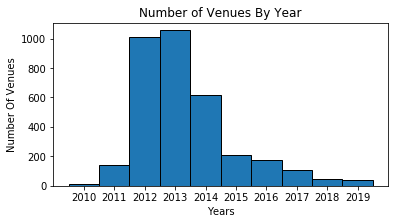

In [15]:
bins = np.arange(2010, 2021)
ax = city_venues.Created_year.plot(kind='hist', figsize=(6, 3), bins=bins, xticks=bins[:-1], edgecolor="k", align='left')

plt.title('Number of Venues By Year') # add a title to the histogram
plt.ylabel('Number Of Venues') # add y-label
plt.xlabel('Years') # add x-label

plt.show()

Now, let's examine the **'PostalCode'** field.

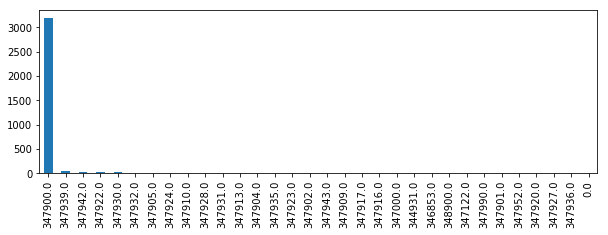

In [16]:
city_venues['PostalCode'].value_counts().plot(kind='bar', figsize=(10,3))

It is obvious that this column is useless because majority venues have postal code equal to 347900. Drop this column as well.

In [17]:
city_venues = city_venues.drop('PostalCode', 1)
city_venues.head()

,Venue,Latitude,Longitude,Category,Id,Rating,Likes,Tips,Price_tier,Category_id,Created_year,Venue_age
5,Место Разворота Маршруток,47.202091,38.854572,Bus Line,5183984a498e46c7f9c5af0a,0.0,0.0,1.0,0.0,4bf58dd8d48988d12b951735,2013,6
7,Ресторан Пирамила,47.217564,38.855255,Eastern European Restaurant,52f6564c498e9e09e3e33147,0.0,0.0,0.0,2.0,4bf58dd8d48988d109941735,2014,5
10,штрафстоянка,47.221715,38.831101,Parking,54bba83b498efc89a60986e4,0.0,0.0,0.0,0.0,4c38df4de52ce0d596b336e1,2015,4
11,ДокАвто,47.223408,38.858902,Gas Station,5275e250498ed7d6b3483e96,0.0,0.0,0.0,0.0,4bf58dd8d48988d113951735,2013,6
12,Евролюкс,47.224610,38.844511,General Travel,506bf89fe4b0101523e50d28,0.0,1.0,0.0,0.0,4bf58dd8d48988d1f6931735,2012,7


Next let's explore the **'Rating'** field.

Text(0.5, 0, 'Rating - (0, 10)')

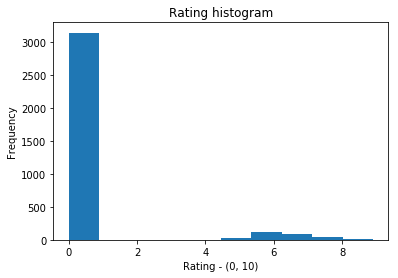

In [18]:
#city_venues.groupby('Rating').count()
city_venues.Rating.plot(kind='hist', bins = 10)
plt.title('Rating histogram')
plt.xlabel('Rating - (0, 10)')

Here we see two seperate sets of venues -- one set with rating equal to 0 and second one greater than 0.
My hypothesis is that the second set consists of venues for food. Let's check it out and plot histogram of venues for food.

In [19]:
#city_venues = pd.read_csv('city_venues_in_box_with_food_field.csv')
food_venues = city_venues[city_venues['Food_venue'] == 1]
food_venues.Rating.plot(kind='hist', bins = 10)
plt.title('Rating of venues for food')
plt.xlabel('Rating - (0, 10)')

KeyError: 'Food_venue'

In [134]:
print('Number of venues with rating greater than 0 is {}.'.format(len(food_venues[food_venues.Rating > 0])))
print('Number of venues with tips greater than 0 is {}.'.format(len(food_venues[food_venues.Tips > 0])))
print('Number of venues with Price_tier greater than 0 is {}.'.format(len(food_venues[food_venues.Price_tier > 0])))

Number of venues with rating greater than 0 is 80.
Number of venues with tips greater than 0 is 208.
Number of venues with Price_tier greater than 0 is 385.


#### Correlation between fields

In [20]:
city_venues.corr()

,Latitude,Longitude,Rating,Likes,Tips,Price_tier,Created_year,Venue_age
Latitude,1.000000,-0.115304,-0.045754,-0.061645,-0.062015,-0.054484,-0.026311,0.026311
Longitude,-0.115304,1.000000,0.055542,0.068591,0.080413,0.087981,0.025289,-0.025289
Rating,-0.045754,0.055542,1.000000,0.495428,0.435916,0.153763,-0.151191,0.151191
Likes,-0.061645,0.068591,0.495428,1.000000,0.871930,0.144708,-0.128767,0.128767
Tips,-0.062015,0.080413,0.435916,0.871930,1.000000,0.203122,-0.117383,0.117383
Price_tier,-0.054484,0.087981,0.153763,0.144708,0.203122,1.000000,0.046388,-0.046388
Created_year,-0.026311,0.025289,-0.151191,-0.128767,-0.117383,0.046388,1.000000,-1.000000
Venue_age,0.026311,-0.025289,0.151191,0.128767,0.117383,-0.046388,-1.000000,1.000000


Summary. Almost all variables demonstrate very weak positive and negative correlations except those that obviously related to each other. For example Tips, Likes and Rating correlate between each other as well as Food_venue and Food_tier.

### Clustering
The core of the analytic method is clustering of all venues in Taganrog city by its fields, 
determining the optimum number of clusters and find suitable cluster for a new restaurant.

In [21]:
#venues = food_venues
venues = city_venues
venues_clustering = pd.get_dummies(venues[['Category']], prefix="", prefix_sep="")
filtered_columns = ['Latitude', 'Longitude', 'Rating', 'Likes', 'Tips', 'Price_tier', 'Venue_age']

# add filtered columns back to dataframe
venues_clustering[filtered_columns] = venues[filtered_columns]

# move filtered columns to be first
fixed_columns = list(venues_clustering.columns[-len(filtered_columns):]) + list(venues_clustering.columns[:-len(filtered_columns)])
venues_clustering = venues_clustering[fixed_columns]

print(venues_clustering.shape)
venues_clustering.head()

(3424, 383)


,Latitude,Longitude,Rating,Likes,Tips,Price_tier,Venue_age,ATM,Accessories Store,Adult Education Center,...,Watch Shop,Water Park,Waterfront,Wine Bar,Wine Shop,Winery,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
5,47.202091,38.854572,0.0,0.0,1.0,0.0,6,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,47.217564,38.855255,0.0,0.0,0.0,2.0,5,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,47.221715,38.831101,0.0,0.0,0.0,0.0,4,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11,47.223408,38.858902,0.0,0.0,0.0,0.0,6,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12,47.224610,38.844511,0.0,1.0,0.0,0.0,7,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Normalize the dataset.

In [22]:
from sklearn.preprocessing import StandardScaler
norm_values = StandardScaler().fit_transform(venues_clustering)
norm_values

C:\Users\pol.OBJECTLAND\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\pol.OBJECTLAND\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


array([[-1.23584464, -2.14382111, -0.30004324, ..., -0.05133646,
        -0.01709214, -0.01709214],
       [-0.46822745, -2.11723657, -0.30004324, ..., -0.05133646,
        -0.01709214, -0.01709214],
       [-0.26228785, -3.05723232, -0.30004324, ..., -0.05133646,
        -0.01709214, -0.01709214],
       ...,
       [ 2.64757879,  0.4677901 , -0.30004324, ..., -0.05133646,
        -0.01709214, -0.01709214],
       [ 2.62574982,  0.52892707, -0.30004324, ..., -0.05133646,
        -0.01709214, -0.01709214],
       [ 2.78192618,  0.62061308, -0.30004324, ..., -0.05133646,
        -0.01709214, -0.01709214]])

In [25]:
max_k = 100
squared_distance = np.zeros(max_k)
for k in range(2,max_k):
    kmeans = KMeans(n_clusters = k, random_state = 0).fit(norm_values)
    squared_distance[k] = kmeans.inertia_
    print(k,sep=' ', end=' ', flush=True)

2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 

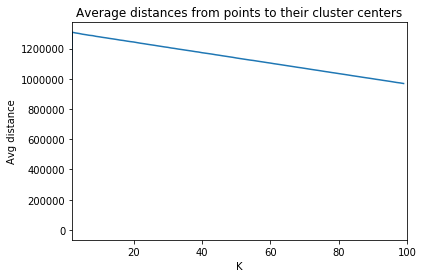

In [26]:
plt.figure()
plt.plot(squared_distance)
plt.xlabel('K')
plt.ylabel('Avg distance')
plt.title('Average distances from points to their cluster centers')
plt.xlim([2,max_k])
plt.show()

#### Cluster venues
Run k-means to cluster all venues into 11 clusters.

In [27]:
num_clusters = 11

k_means = KMeans(init="k-means++", n_clusters=num_clusters, random_state=0)
k_means.fit(norm_values)
labels = k_means.labels_

print(labels[:10])

[9 6 1 1 1 1 2 1 1 1]


#### Assign labels to venues

In [29]:
venues['Labels'] = labels
venues['Labels'].value_counts()

1     3010
6      199
2       62
7       42
9       26
4       26
0       23
3       13
5        8
10       8
8        7
Name: Labels, dtype: int64

#### Let's display our clustered venues on map

In [30]:
import matplotlib.cm as cm
import matplotlib.colors as colors

def plot_clusters(venues, center, kclusters):
    # create map
    map_clusters = folium.Map(location=[center[0], center[1]], zoom_start=12)

    # set color scheme for the clusters
    x = np.arange(kclusters)
    ys = [i + x + (i*x)**2 for i in range(kclusters)]
    colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
    rainbow = [colors.rgb2hex(i) for i in colors_array]

    # add markers to the map
    markers_colors = []
    for lat, lon, cat, cluster in zip(venues['Latitude'], venues['Longitude'], venues['Category'], venues['Labels']):
        label = folium.Popup('Cluster' + str(cluster) + ' - ' + cat, parse_html=True)
        folium.CircleMarker(
            [lat, lon],
            radius=5,
            popup=label,
            color=rainbow[cluster-1],
            fill=True,
            fill_color=rainbow[cluster-1],
            fill_opacity=0.7).add_to(map_clusters)
       
    return map_clusters

In [32]:
# narrow displayed venues whose category is food
plot_clusters(venues, city_center, num_clusters)

Now let's create the new dataframe **clusters_df** with the top 5 venue's category for each cluster.

In [33]:
def createClustersRating(df_labeled, clusters):
    df = pd.DataFrame(columns=['Label','1st','2nd','3rd', '4th', '5th'])
    df['Label'] = range(0, clusters)    
    for c in range(0, clusters):
        s = df_labeled[df_labeled['Labels'] == c]['Category'].value_counts()
        df.iloc[c, 1:] = getClusterFirstFiveCategories(s)
    df['Total'] = df_labeled.groupby('Labels').count().Venue
    return df

def getClusterFirstFiveCategories(s):
    cat = []
    for i in range(0, 5):
        try: cat.append(s.index[i])
        except: cat.append(None)
    return cat

In [34]:
clusters_df = createClustersRating(venues, num_clusters)
clusters_df

,Label,1st,2nd,3rd,4th,5th,Total
0,0,Park,None,None,None,None,23
1,1,Office,Residential Building (Apartment / Condo),Salon / Barbershop,Café,Bank,3010
2,2,Miscellaneous Shop,Boat or Ferry,Platform,Train,Laser Tag,62
3,3,Police Station,None,None,None,None,13
4,4,Post Office,None,None,None,None,26
5,5,Moving Target,None,None,None,None,8
6,6,Restaurant,Bar,Nightclub,Sushi Restaurant,Eastern European Restaurant,199
7,7,Shopping Mall,Coffee Shop,Café,Beach,Japanese Restaurant,42
8,8,Scenic Lookout,None,None,None,None,7
9,9,Bus Line,None,None,None,None,26


## Results
This section summarizes the results of clustering. Empirically we identified 11 clusters of venues, let us first see what these clusters are. 
To help with interpreting the data, let's sort the clusters by a meaningful attribute. A good candidate for such attribute is total number of venues in each cluster.

In [35]:
clusters_df.sort_values('Total', ascending=False)

,Label,1st,2nd,3rd,4th,5th,Total
1,1,Office,Residential Building (Apartment / Condo),Salon / Barbershop,Café,Bank,3010
6,6,Restaurant,Bar,Nightclub,Sushi Restaurant,Eastern European Restaurant,199
2,2,Miscellaneous Shop,Boat or Ferry,Platform,Train,Laser Tag,62
7,7,Shopping Mall,Coffee Shop,Café,Beach,Japanese Restaurant,42
4,4,Post Office,None,None,None,None,26
9,9,Bus Line,None,None,None,None,26
0,0,Park,None,None,None,None,23
3,3,Police Station,None,None,None,None,13
5,5,Moving Target,None,None,None,None,8
10,10,IT Services,None,None,None,None,8


In [403]:
clusters_df.sort_values('Total', ascending=False)

,Label,1st,2nd,3rd,4th,5th,Total
1,1,Restaurant,Sushi Restaurant,Pizza Place,Snack Place,BBQ Joint,162
6,6,Café,Cafeteria,Bistro,Caucasian Restaurant,Pastry Shop,146
4,4,Eastern European Restaurant,Italian Restaurant,Restaurant,Japanese Restaurant,Café,27
7,7,Coffee Shop,None,None,None,None,23
2,2,Fast Food Restaurant,None,None,None,None,18
10,10,Bakery,None,None,None,None,15
3,3,Diner,None,None,None,None,12
9,9,Burger Joint,None,None,None,None,10
8,8,Sandwich Place,None,None,None,None,9
0,0,Dessert Shop,None,None,None,None,7


In the table above the data is sorted in descending order, with the highest total number at the top.

Clusters 1 and 6 are the biggest among others and represented by such venue categories as Cafe, Cafeteria, Sushi, Pizza, Snack ect. It shows that the number of restaurants are high and it is risky to open a restaurant similar to clusters 1 and 6. 

Cluster 4 contains of cuisines of different countries: Eastern European, Italian, Japanese.

The rest clusters have a small number of venues and introduced by a single category.

## Discussion

One interesting observation is that small restaurants (such as Cafe, Cafeteria, Sushi, Pizza, etc.) are over big restaurants.
There is a small number of restaurants of different cuisines and a recommendation might be to open a restaurant of national cuisine (for instance Indian Restaurant).

## Conclusion

The project analyzes venue similarity based on data obtained from Foursquare. 
The data needed cleaning as it contained nonexistent venues and missing data. We can observe a lack of restaurants of national cuisines and suitable cluster for opening a restaurant.

However, we wish Foursquare had returned more venues as the data was very sparse and difficult to use for clustering. In future work, it may also be useful to include data pertaining to schools, universities, and such. 
